In [60]:
import pandas as pd
import scanpy as sc
import numpy as np
from collections import defaultdict

import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sb
import colorcet as cc

In [61]:
path_data='/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/combined/'
path_genes='/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/gene_lists/'
path_save='/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/combined/ct_composition/subtypes/'

In [62]:
# Get endothelial cells
obs_names=sc.read(
    path_data+'data_integrated_analysed.h5ad',backed='r'
    ).obs.query('cell_type_integrated_v1=="endothelial"').index
obs_names.shape

(13469,)

In [63]:
# Load rawnorm. Correctly norm expression is in layers X_sf_integrated
adata_rn=sc.read(path_data+'data_rawnorm_integrated_annotated.h5ad')[obs_names,:].copy()
adata_rn.X=adata_rn.layers['X_sf_integrated']

In [64]:
# Redo embedding
sc.pp.neighbors(adata_rn, use_rep='X_integrated'  )
sc.tl.umap(adata_rn)

## Known markers

In [65]:
# orthologues
orthologues=pd.read_table(path_genes+'orthologues_ORGmus_musculus_ORG2homo_sapiens_V103.tsv'
                         ).rename(
    {'Gene name':'gs_mm','Human gene name':'gs_hs','Gene stable ID':'eid_mm'},axis=1)

In [66]:
# Human markers
markers_human={
'endothelial': ['PECAM1', 'CDH5', 'VWF','PLVAP'],
'microvascular':['PLVAP', 'RAMP2', 'RAMP3', 'VWF'],
'capillary': ['RGCC', 'CA4', 'AQP1', 'VWA1'],
'arterial capillary':['CA4', 'FCN3'],
'arterial': ['SEMA3G', 'HEY1', 'DLL4', 'GJA4',  'EFNB2'],
'venous': ['ACKR1', 'NR2F2', 'DLL1', 'PLVAP', 'PLAT', 'VWF'],
'lymphatic': ['PROX1', 'PDPN', 'MMRN1','LYVE1',  'CCL21', 'PTPRE'],
'pericytes': ['ABCC9', 'KCNJ8', 'CSPG4','RGS5', 'MCAM','COX4I2', 'HIGD1B', 'NOTCH3', 'FAM162B'],
'smooth_muscle': ['MYH11', 'ACTA2', 'TAGLN', 'CNN1'],
'mesothelial': ['TBX1', 'WT1', 'MSLN', 'CALB2', 'PRG4']
 }

In [67]:
# Mouse markers
markers=defaultdict(set)

In [68]:
# Map human to mouse. print missing orthologues
for group,gs in markers_human.items():
    for g in gs:
        mm_gss=orthologues.query('gs_hs ==@g')['gs_mm']
        if len(mm_gss)==0:
            print(g)
        else:
            markers[group].update(mm_gss)

FCN3


C: Note that some pericyte markers are also showing up in stellate (activated)

In [69]:
genes_all=set(adata_rn.var.gene_symbol)

endothelial


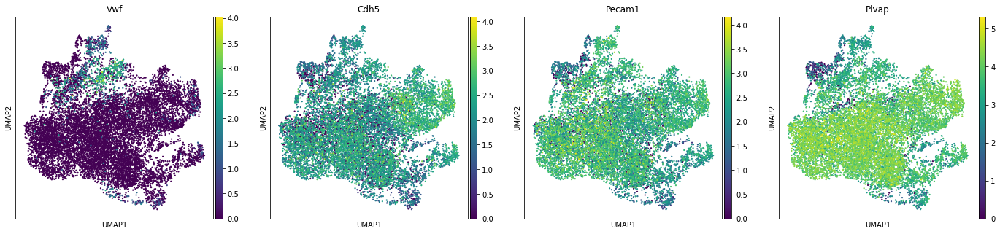

capillary


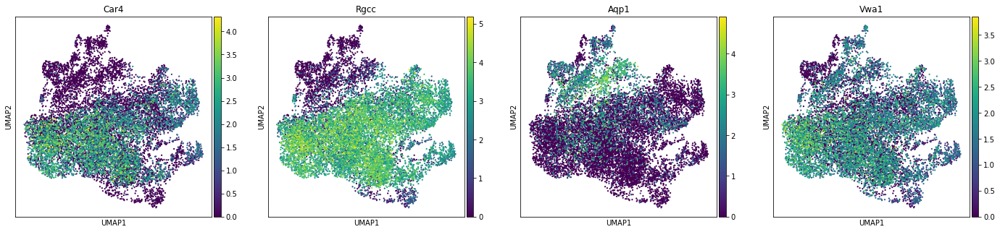

arterial capillary


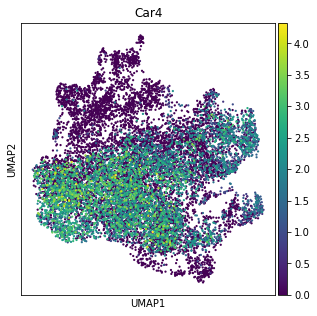

arterial


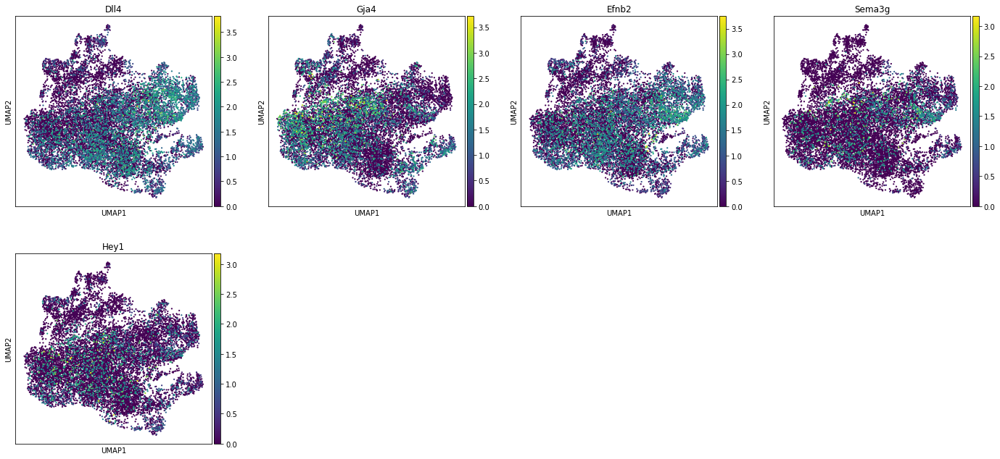

venous


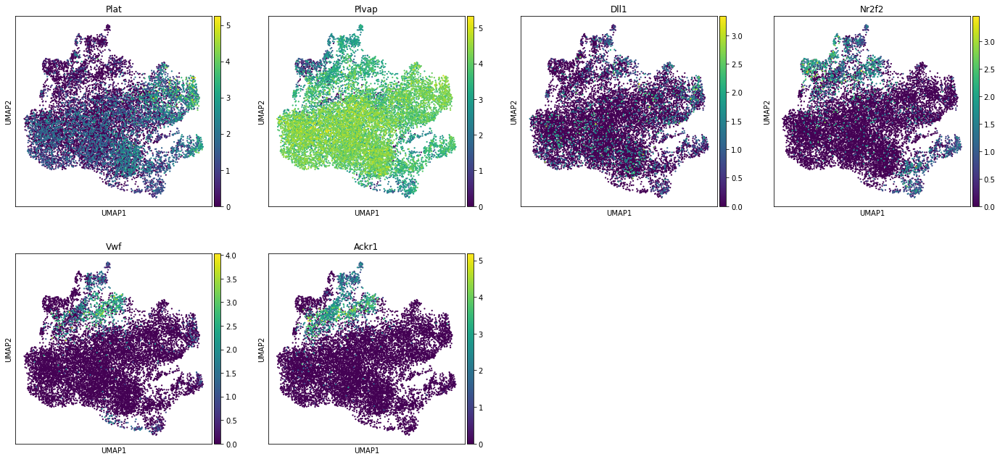

lymphatic


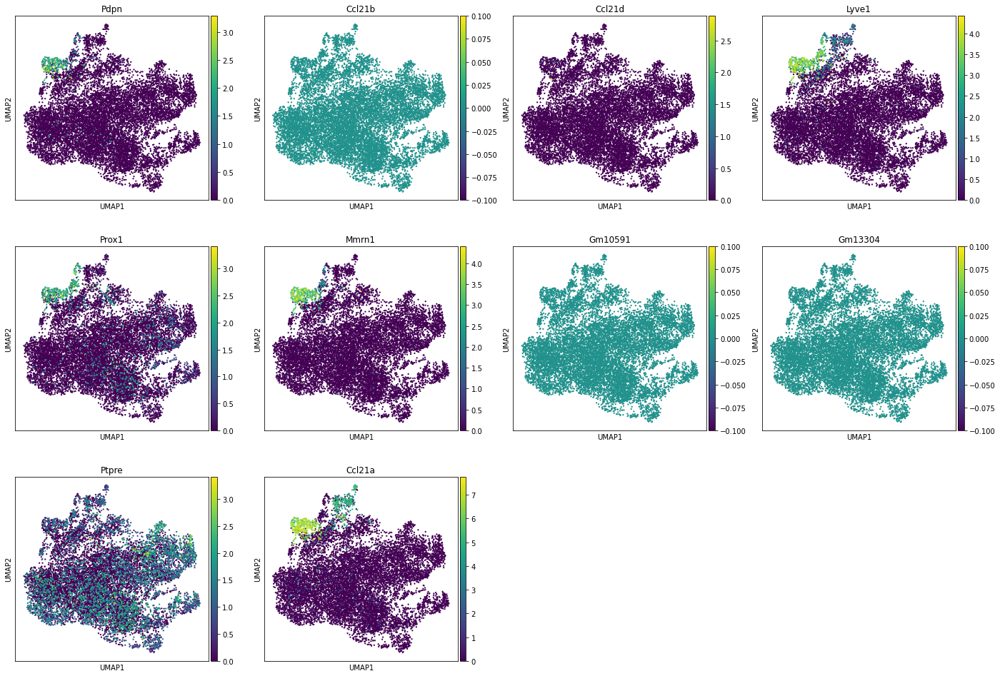

pericytes


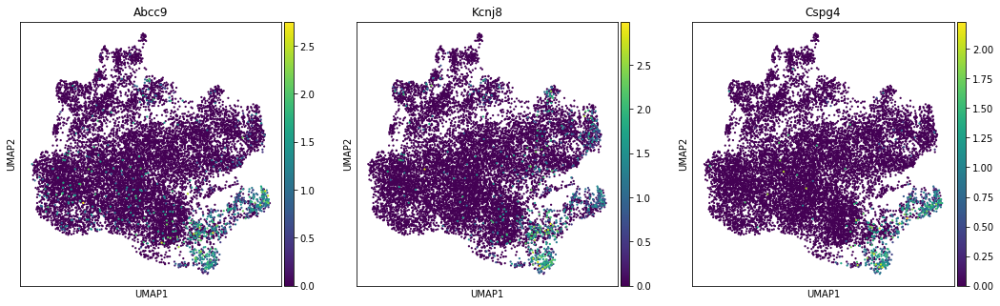

smooth_muscle


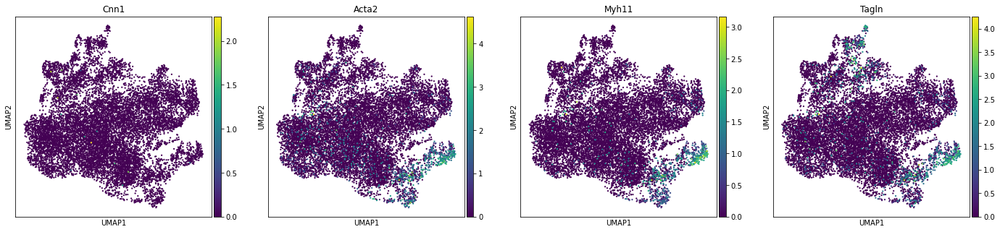

mesothelial


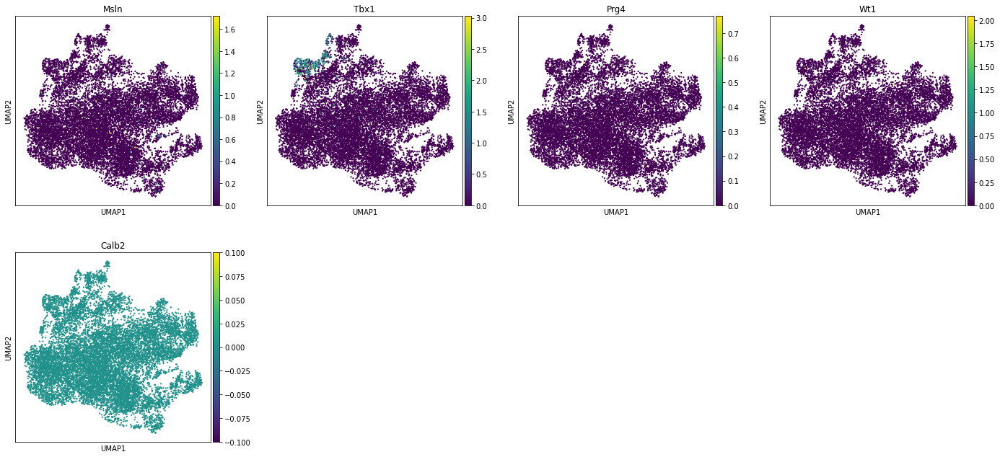

In [70]:
for group,genes in markers.items():
    rcParams['figure.figsize']=(5,5)
    print(group)
    sc.pl.umap(adata_rn,color=[g for g in genes if g in genes_all],
               gene_symbols='gene_symbol',s=20)

Markers from: https://pubmed.ncbi.nlm.nih.gov/32059779/ (S5)

In [35]:
markers_mm={
    'arthery':['8430408G22Rik',
         'Clu',
         'Crip1',
         'Fbln2',
         'Gja4',
         'Hey1',
         'Mecom',
         'Sat1',
         'Sema3g',
         'Sox17',
         'Tm4sf1',
         'Tsc22d1'],
    'capillary':['AW112010',
         'BC028528',
         'Car4',
         'Cd200',
         'Cd300lg',
         'Gpihbp1',
         'Kdr',
         'Rgcc',
         'Sgk1',
         'Sparc'],
    'vein':['Apoe', 'Bgn', 'Ctla2a', 'Icam1', 'Il6st', 'Ptgs1', 'Tmsb10', 'Vcam1', 'Vwf'],
    'lymphatic':['Ccl21a',
         'Cd63',
         'Cp',
         'Fgl2',
         'Flt4',
         'Fth1',
         'Fxyd6',
         'Maf',
         'Marcks',
         'Mmrn1',
         'Pard6g',
         'Pdpn',
         'Prelp',
         'Reln',
         'Rnase4',
         'Scn1b',
         'Stab1',
         'Thy1',
         'Timp2',
         'Timp3']
}

arthery


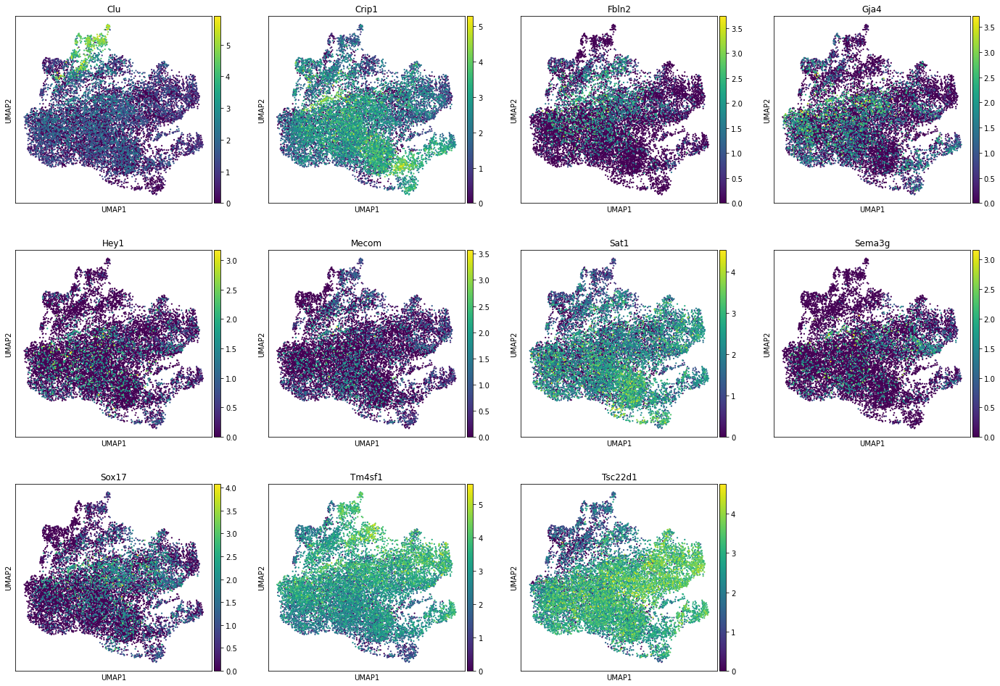

capillary


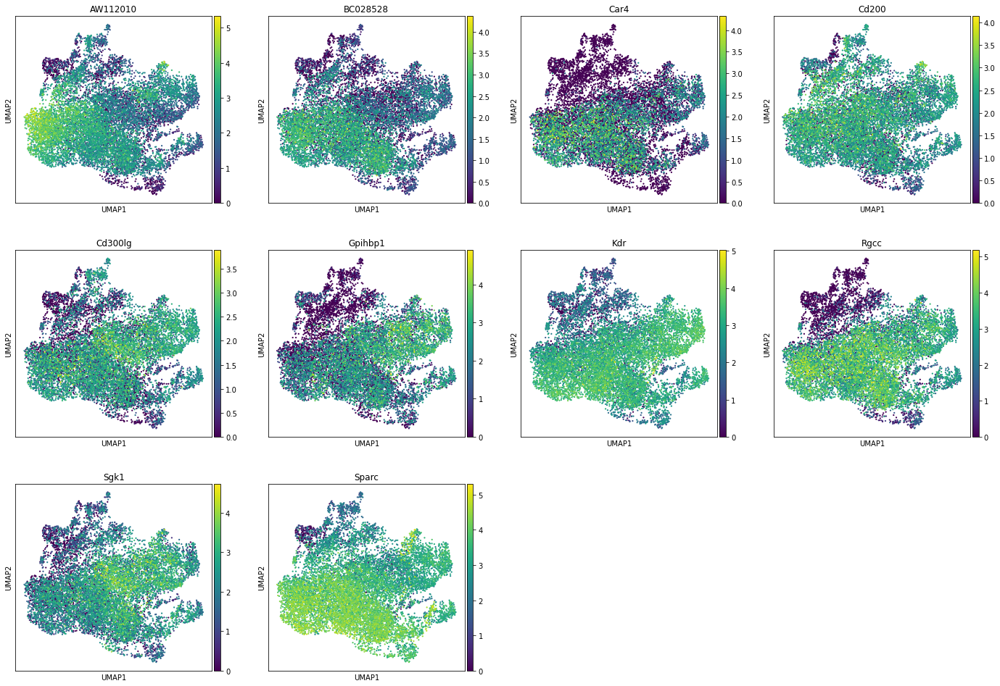

vein


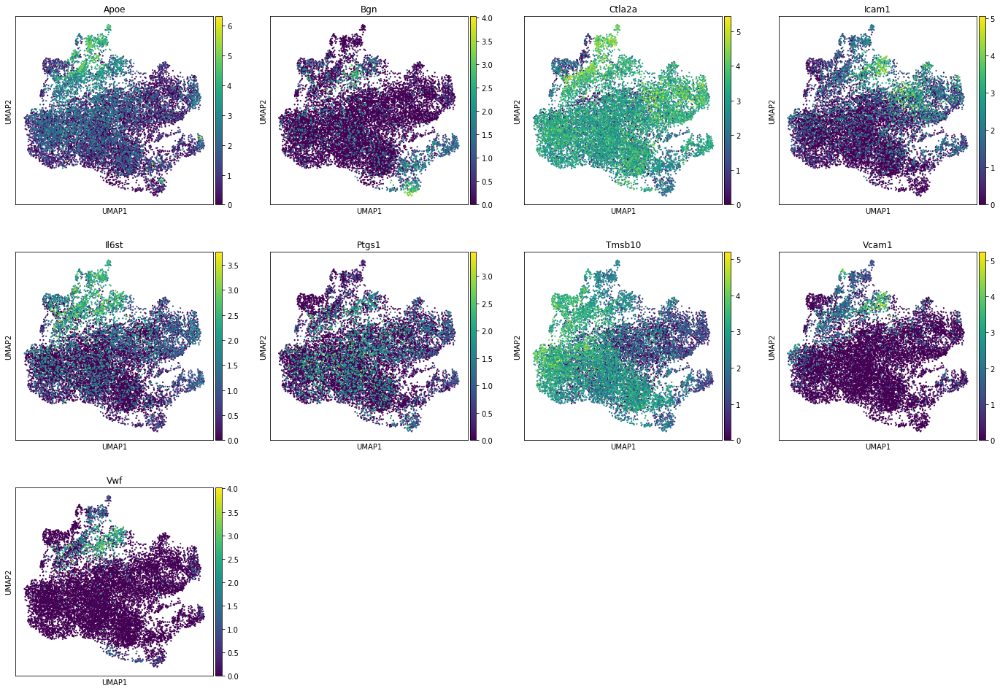

lymphatic


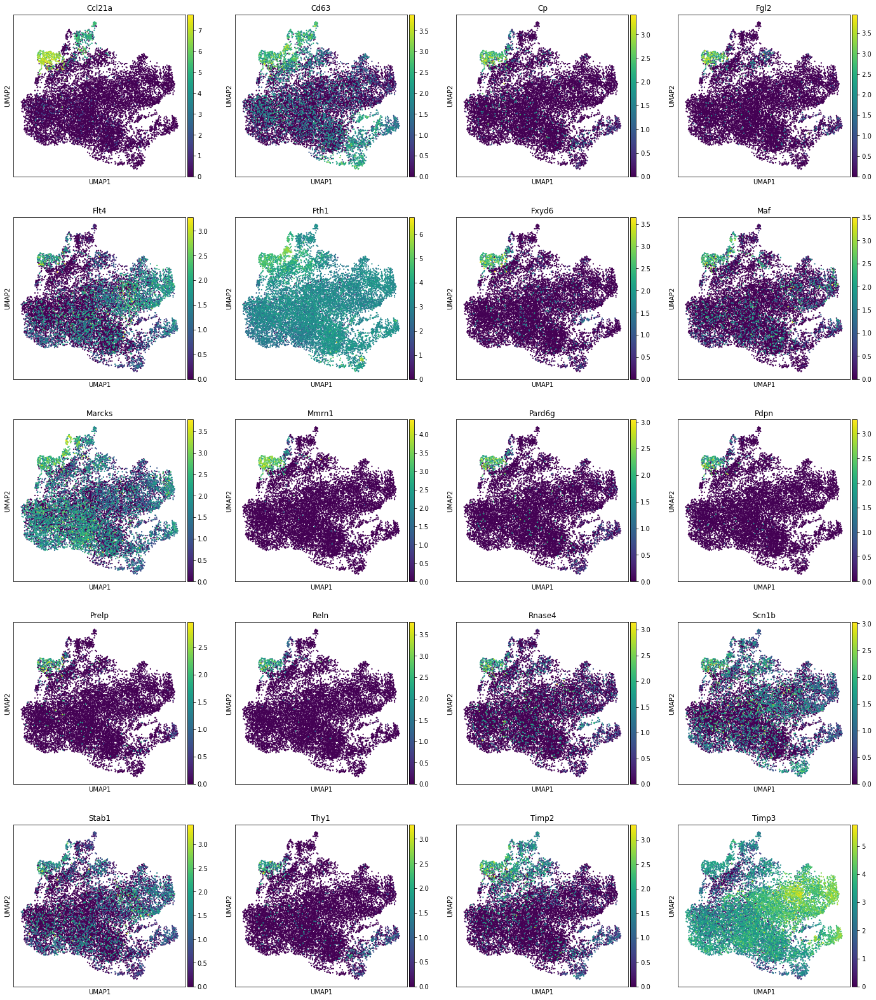

In [38]:
for group,genes in markers_mm.items():
    rcParams['figure.figsize']=(5,5)
    print(group)
    sc.pl.umap(adata_rn,color=[g for g in genes if g in genes_all],
               gene_symbols='gene_symbol',s=20)

#### Find markers of each cluster

In [77]:
sc.tl.leiden(adata_rn,resolution=1)

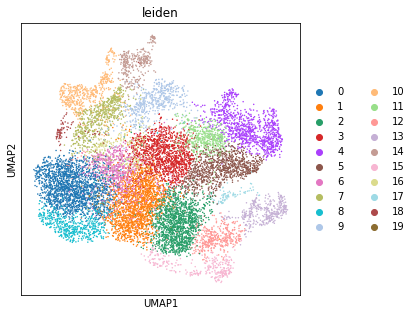

In [78]:
sc.pl.umap(adata_rn,color='leiden')

In [14]:
# Find markers OvR
sc.tl.rank_genes_groups(adata_rn, groupby='leiden')
sc.tl.filter_rank_genes_groups(adata_rn)

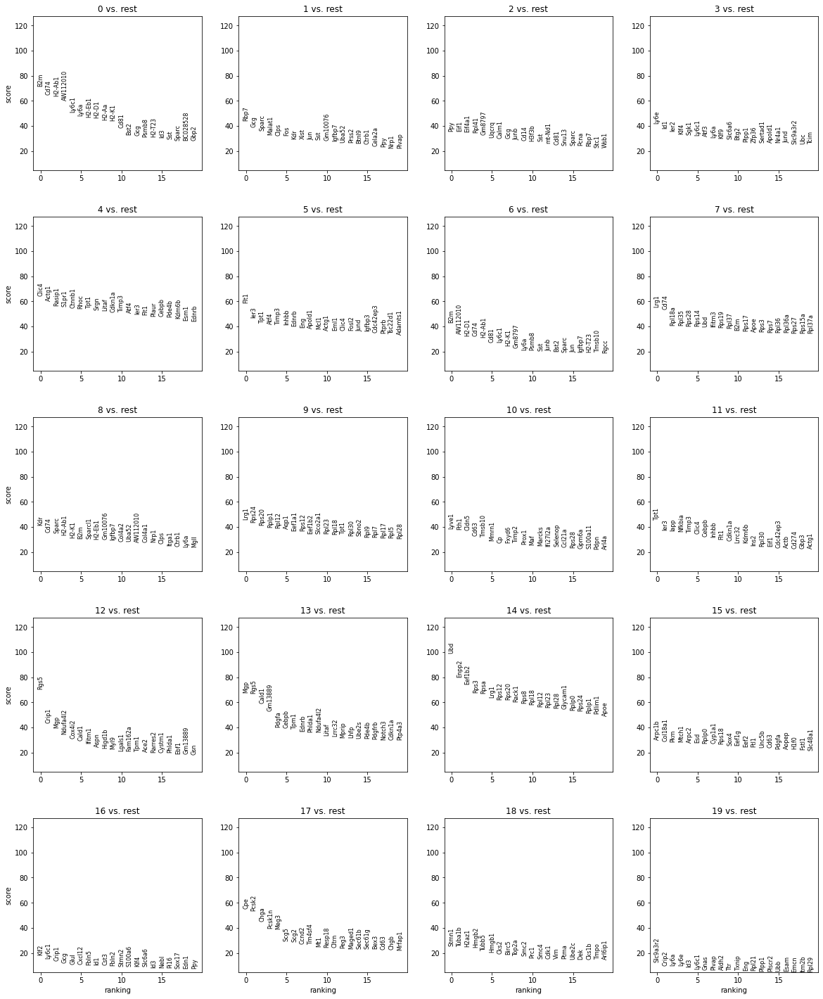

In [15]:
# Markers OVR
sc.pl.rank_genes_groups(adata_rn,gene_symbols ='gene_symbol')

In [79]:
# Save enrichment tables
writer = pd.ExcelWriter(path_save+'endothelial_clmarkers.xlsx',
                        engine='xlsxwriter') 
for cl in adata_rn.obs['leiden'].cat.categories:
    data=pd.DataFrame({
        'padj':adata_rn.uns['rank_genes_groups']['pvals_adj'][str(cl)],
        'lFC':adata_rn.uns['rank_genes_groups']['logfoldchanges'][str(cl)],
        'EID':adata_rn.uns['rank_genes_groups']['names'][str(cl)],
        'gene_symbol':adata_rn.var.loc[
            adata_rn.uns['rank_genes_groups']['names'][str(cl)],'gene_symbol'],
        'retained':[isinstance(n,str) 
                    for n in adata_rn.uns['rank_genes_groups_filtered']['names'][str(cl)]]
    })
    data.to_excel(writer, sheet_name=str(cl))   
writer.save()

In [80]:
path_save+'endothelial_clmarkers.xlsx'

'/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/combined/ct_composition/subtypes/endothelial_clmarkers.xlsx'

### Annotation

Plot study to help with removing batch-driven subtypes in annotation, since it is unclear if this are residual batch effects or true bio differences.

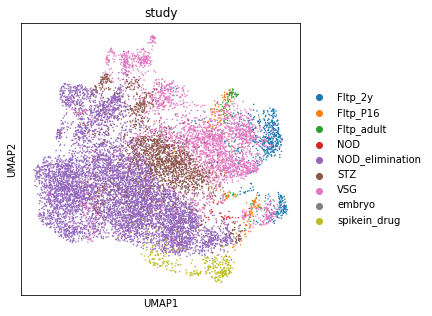

In [40]:
sc.pl.umap(adata_rn,color='study')

Add annotation names - saved as tab names in corresponding excel file

In [74]:
annotation = pd.ExcelFile(path_save+'endothelial_clmarkers_annotated.xlsx').sheet_names
print(annotation)

['EC_MHCII', 'EC_acinar', 'EC_Cd14+', 'EC_immature', 'EC_ven1', 'Inhbb+EC', 'EC_MHCI', 'Lrg1+EC', 'EC_cap', 'EC_ven2', 'EC_art1', 'Cebpb+EC', 'Rgs5+EC', 'Mgp+EC', 'Ubd+EC', 'EC_preBreach', 'id1+EC', 'Cpe+EC', 'STm1+EC', 'Txnip+EC']


In [79]:
# Map clusters
annotation_map=dict(zip(adata_rn.obs['leiden'].cat.categories,annotation))
adata_rn.obs['cell_subtype_v0']=adata_rn.obs.leiden.map(annotation_map)

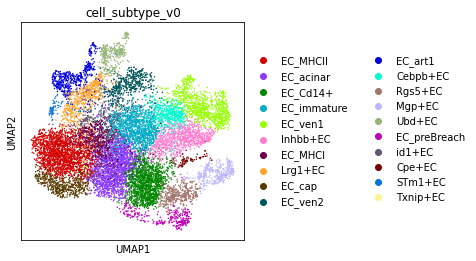

In [80]:
rcParams['figure.figsize']=(4,4)
sc.pl.umap(adata_rn,color=['cell_subtype_v0'
                           #,'cell_subtype_v0_parsed'
                          ],
           palette=sb.color_palette(cc.glasbey, 
                                    n_colors=adata_rn.obs['cell_subtype_v0'].nunique()),ncols=1)

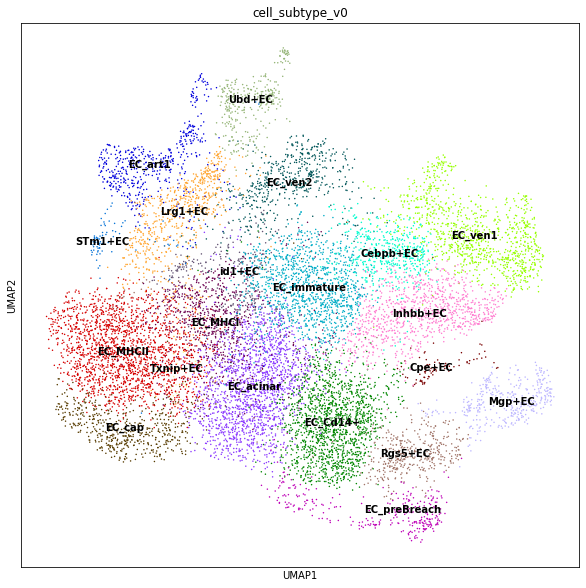

In [81]:
rcParams['figure.figsize']=(10,10)
sc.pl.umap(adata_rn,color=['cell_subtype_v0'
                           #,'cell_subtype_v0_parsed'
                          ],
           palette=sb.color_palette(cc.glasbey, 
                                    n_colors=adata_rn.obs['cell_subtype_v0'].nunique()),
           ncols=1,legend_loc='on data')

C: These annotations are probably batch driven - need to be coarsened.

In [84]:
# Coarse ct
ct_coarse_map={
'Cebpb+EC':'capilary',
 'Cpe+EC':'capilary',
 'EC_Cd14+':'capilary',
 'EC_MHCI':'capilary',
 'EC_MHCII':'capilary',
 'EC_acinar':'capilary',
 'EC_art1':'lymphatic',
 'EC_cap':'capilary',
 'EC_immature':'capilary',
 'EC_preBreach':'pericyte-like',
 'EC_ven1':'capilary',
 'EC_ven2':'vein',
 'Inhbb+EC':'capilary',
 'Lrg1+EC':'vein',
 'Mgp+EC':'pericyte-like',
 'Rgs5+EC':'pericyte-like',
 'STm1+EC':'multiplet',
 'Txnip+EC':'capilary',
 'Ubd+EC':'vein',
 'id1+EC':'capilary'
}
adata_rn.obs['cell_subtype_v1_parsed_coarse']=adata_rn.obs['cell_subtype_v0'].map(
    ct_coarse_map)

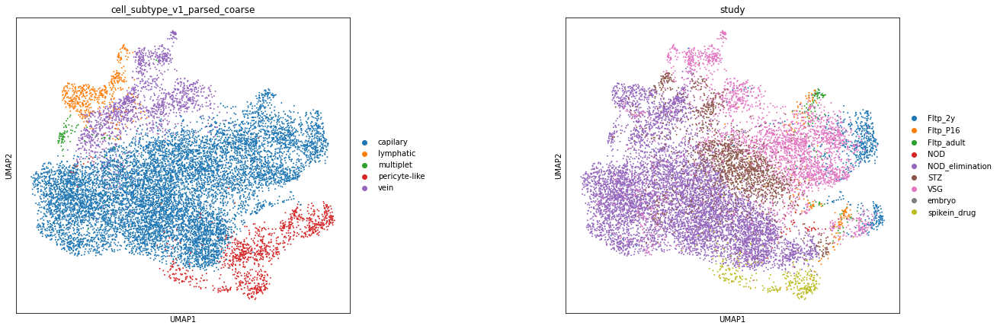

In [89]:
rcParams['figure.figsize']=(7,7)
sc.pl.umap(adata_rn,color=['cell_subtype_v1_parsed_coarse','study'],
           wspace=0.5,s=15)

## Save

In [99]:
adata_rn

AnnData object with n_obs × n_vars = 13469 × 30672
    obs: 'study_sample', 'study', 'file', 'reference', 'size_factors_sample', 'S_score', 'G2M_score', 'phase', 'phase_cyclone', 's_cyclone', 'g2m_cyclone', 'g1_cyclone', 'sex', 'pre_cell_type', 'ins_score', 'ins_high', 'gcg_score', 'gcg_high', 'sst_score', 'sst_high', 'ppy_score', 'ppy_high', 'cell_filtering', 'age', 'design', 'strain', 'tissue', 'technique', 'internal_id', 'batch', 'study_sample_design', 'cell_type', 'cell_type_multiplet', 'cell_subtype', 'cell_subtype_multiplet', 'size_factors_integrated', 'leiden', 'cell_subtype_v0', 'cell_subtype_v1_parsed_coarse'
    var: 'gene_symbol', 'used_integration', 'gene_symbol_original_matched'
    uns: 'cell_type_multiplet_colors', 'neighbors', 'pre_cell_type_colors', 'umap', 'leiden', 'leiden_colors', 'cell_subtype_v0_colors', 'cell_subtype_v1_parsed_coarse_colors', 'study_colors', 'study_sample_design_colors'
    obsm: 'X_integrated', 'X_umap'
    layers: 'X_sf_integrated'
    obsp: 'd

In [98]:
adata_rn.write(path_data+'data_rawnorm_integrated_analysed_endothelial.h5ad')

## Proportion changes in T2D

Plot of embedding of samples relevant for diabetes analysis (potential population shifts):
- two studies: VSG, STZ (start of sample name)
- healthy samples contain control/WT, others are T2D

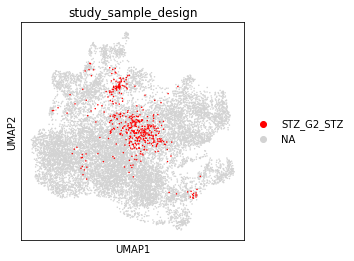

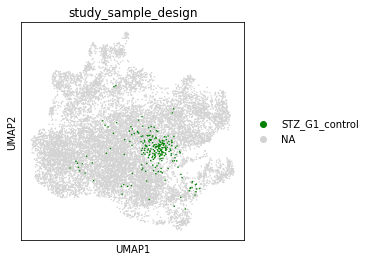

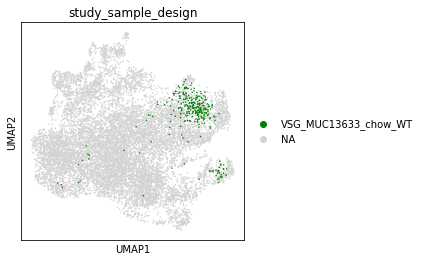

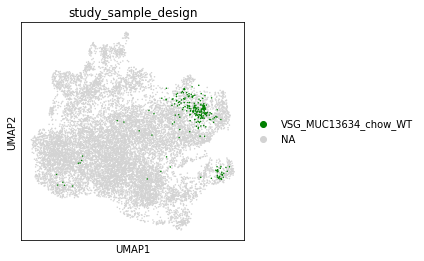

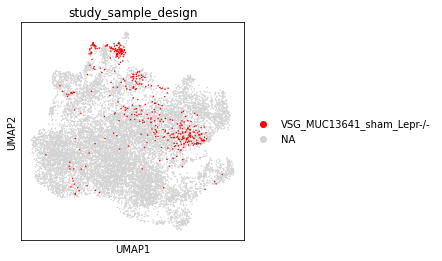

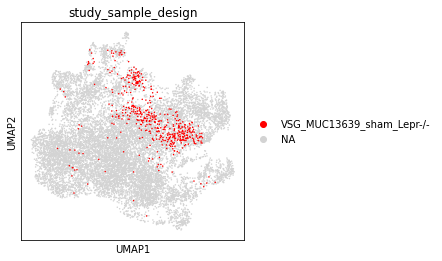

In [96]:
rcParams['figure.figsize']=(4,4)
for sample in ['STZ_G2_STZ','STZ_G1_control','VSG_MUC13633_chow_WT',
 'VSG_MUC13634_chow_WT', 'VSG_MUC13641_sham_Lepr-/-', 'VSG_MUC13639_sham_Lepr-/-']:
    sc.pl.umap(adata_rn,color='study_sample_design',groups=[sample],
               palette='g' if 'control' in sample or 'WT' in sample else 'r')

In [8]:
obs=sc.read(path_data+'data_rawnorm_integrated_analysed_endothelial.h5ad',backed='r').obs.copy()

Subset to relevant T2D samples

In [9]:
samples=['STZ_G2_STZ','STZ_G1_control','VSG_MUC13633_chow_WT',
 'VSG_MUC13634_chow_WT', 'VSG_MUC13641_sham_Lepr-/-', 'VSG_MUC13639_sham_Lepr-/-',]
obs_sub=obs.query('study_sample_design in @samples ').copy()

obs_sub['study_sample_design'].unique()

['VSG_MUC13639_sham_Lepr-/-', 'VSG_MUC13633_chow_WT', 'VSG_MUC13634_chow_WT', 'VSG_MUC13641_sham_Lepr-/-', 'STZ_G2_STZ', 'STZ_G1_control']
Categories (49, object): ['Fltp_2y_MUC13974_mRFP', 'Fltp_2y_MUC13975_mTmG', 'Fltp_P16_146_mRFP_mRFP', 'Fltp_adult_mouse1_head_Fltp-', ..., 'spikein_drug_SRR10751513_A10_r3', 'spikein_drug_SRR10751514_DMSO_r3', 'spikein_drug_SRR10751515_FOXO_r3', 'spikein_drug_SRR10751516_GABA_r3']

In [10]:
pd.crosstab(obs_sub['study_sample_design'],obs_sub['cell_subtype_v1_parsed_coarse'])

cell_subtype_v1_parsed_coarse,capilary,lymphatic,multiplet,pericyte-like,vein
study_sample_design,,,,,
STZ_G1_control,219,0,0,19,2
STZ_G2_STZ,330,7,4,16,86
VSG_MUC13633_chow_WT,270,0,0,31,0
VSG_MUC13634_chow_WT,212,0,0,29,1
VSG_MUC13639_sham_Lepr-/-,385,13,0,7,118
VSG_MUC13641_sham_Lepr-/-,242,34,0,4,145


In [11]:
# Proportions of cells per ct
props=pd.crosstab(obs_sub['study_sample_design'],obs_sub['cell_subtype_v1_parsed_coarse'],
                  normalize='index')

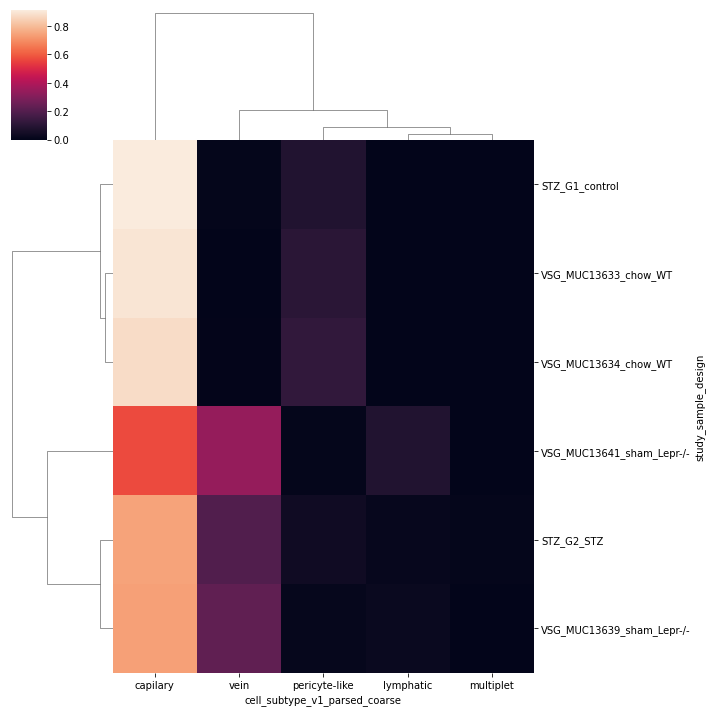

In [12]:
sb.clustermap(props)

C: Unclear if this may be technical or true bio effect. 